In [1]:
import numpy as np
import pandas as pd
import re
import nltk
import spacy
import string
pd.options.mode.chained_assignment = None

# Default value of display.max_rows is 10 i.e. at max 10 rows will be printed.
# Set it None to display all rows in the dataframe
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

#show all prints
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


### Load Data

In [84]:
df = pd.read_csv("../../data/raw/Reviews.csv")

### Drop Duplicates considering only `Score` `Text` & `Summary`

In [85]:
num_dups = df.duplicated(subset=["Summary", "Score", "Text"]).sum()
print(f"{num_dups} entries ({(num_dups/df.shape[0])*100:.2f}%) data is duplicated")

173448 entries (30.51%) data is duplicated


##### drop duplicated data and remove not needed columns and store new dataframe

In [87]:
df_inter = df.drop_duplicates(subset=["Summary","Score","Text"])
df_inter = df_inter.drop(columns=['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator','Time'])
df_inter.shape


(395006, 3)

In [88]:
df_inter.shape
df_inter.describe()
print("Show Nan\n ")
df_inter.isna().sum()
print("\nFor the targeted Models the columns Score and Summary are important\nRows with NAN in the respective columns will be droped")
df_inter = df_inter.loc[~df_inter["Summary"].isna()]
df_inter.isna().sum()

(395006, 3)

,Score
count,395006.000000
mean,4.178612
std,1.312806
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


Show Nan
 


Score      0
Summary    3
Text       0
dtype: int64


For the targeted Models the columns Score and Summary are important
Rows with NAN in the respective columns will be droped


Score      0
Summary    0
Text       0
dtype: int64

### save dataframe wo/ duplicated|Nan

In [89]:
df_inter.to_csv("../../data/intermediate/food_reviews.csv", index=False)

# PreProcessing
##### Column `Summary` & `Text` will be processed at the same time

In [90]:
df = pd.read_csv("../../data/intermediate/food_reviews.csv") 

### Removal of Punctuations

In [92]:
PUNCT_TO_REMOVE = '"#$%&*+-/=?@[\\]^_`{|}~;'
def remove_punctuation(text):
    return text.translate(str.maketrans('', '', PUNCT_TO_REMOVE))

In [93]:
df["Summary_processed"] = df["Summary"].apply(lambda summary: remove_punctuation(summary))
df["Text_processed"] = df["Text"].apply(lambda text: remove_punctuation(text))
df[["Text","Text_processed", "Summary", "Summary_processed"]].sample()

,Text,Text_processed,Summary,Summary_processed
160245,"I've tried several different brands for blackberry tea and this is my favorite, it's very fragrant and has recognizable blackberry pieces and blossoms. Some other brands tend to smell and taste only purple.","I've tried several different brands for blackberry tea and this is my favorite, it's very fragrant and has recognizable blackberry pieces and blossoms. Some other brands tend to smell and taste only purple.",Excellent blackberry tea,Excellent blackberry tea


### RegEx for `!`. 
##### Exclamation mark semms to be a good indicator for the extreme

In [94]:
import re
def findExclmaionMarkAndSetWhitespacesAround(str):
        return re.sub('\\b!',' !',str)

In [95]:
df["Summary_processed"] = df["Summary_processed"].apply(lambda summary: findExclmaionMarkAndSetWhitespacesAround(summary) )
df["Text_processed"] = df["Text_processed"].apply(lambda text: findExclmaionMarkAndSetWhitespacesAround(text) )

### Removal of Stopwords
#### not necessary for BERT. BERT needs stopwords

### Lemmatazation / Stemming
####  Not necessary, would lead to lose the context 
#### https://stackoverflow.com/questions/63633534/is-it-necessary-to-do-stopwords-removal-stemming-lemmatization-for-text-classif

## check for emojis/emoticons

In [42]:
# Thanks : https://github.com/NeelShah18/emot/blob/master/emot/emo_unicode.py
EMOTICONS = {
    u":‑\)":"Happy face or smiley",
    u":\)":"Happy face or smiley",
    u":-\]":"Happy face or smiley",
    u":\]":"Happy face or smiley",
    u":-3":"Happy face smiley",
    u":3":"Happy face smiley",
    u":->":"Happy face smiley",
    u":>":"Happy face smiley",
    u"8-\)":"Happy face smiley",
    u":o\)":"Happy face smiley",
    u":-\}":"Happy face smiley",
    u":\}":"Happy face smiley",
    u":-\)":"Happy face smiley",
    u":c\)":"Happy face smiley",
    u":\^\)":"Happy face smiley",
    u"=\]":"Happy face smiley",
    u"=\)":"Happy face smiley",
    u":‑D":"Laughing, big grin or laugh with glasses",
    u":D":"Laughing, big grin or laugh with glasses",
    u"8‑D":"Laughing, big grin or laugh with glasses",
    u"8D":"Laughing, big grin or laugh with glasses",
    u"X‑D":"Laughing, big grin or laugh with glasses",
    u"XD":"Laughing, big grin or laugh with glasses",
    u"=D":"Laughing, big grin or laugh with glasses",
    u"=3":"Laughing, big grin or laugh with glasses",
    u"B\^D":"Laughing, big grin or laugh with glasses",
    u":-\)\)":"Very happy",
    u":‑\(":"Frown, sad, andry or pouting",
    u":-\(":"Frown, sad, andry or pouting",
    u":\(":"Frown, sad, andry or pouting",
    u":‑c":"Frown, sad, andry or pouting",
    u":c":"Frown, sad, andry or pouting",
    u":‑<":"Frown, sad, andry or pouting",
    u":<":"Frown, sad, andry or pouting",
    u":‑\[":"Frown, sad, andry or pouting",
    u":\[":"Frown, sad, andry or pouting",
    u":-\|\|":"Frown, sad, andry or pouting",
    u">:\[":"Frown, sad, andry or pouting",
    u":\{":"Frown, sad, andry or pouting",
    u":@":"Frown, sad, andry or pouting",
    u">:\(":"Frown, sad, andry or pouting",
    u":'‑\(":"Crying",
    u":'\(":"Crying",
    u":'‑\)":"Tears of happiness",
    u":'\)":"Tears of happiness",
    u"D‑':":"Horror",
    u"D:<":"Disgust",
    u"D:":"Sadness",
    u"D8":"Great dismay",
    u"D;":"Great dismay",
    u"D=":"Great dismay",
    u"DX":"Great dismay",
    u":‑O":"Surprise",
    u":O":"Surprise",
    u":‑o":"Surprise",
    u":o":"Surprise",
    u":-0":"Shock",
    u"8‑0":"Yawn",
    u">:O":"Yawn",
    u":-\*":"Kiss",
    u":\*":"Kiss",
    u":X":"Kiss",
    u";‑\)":"Wink or smirk",
    u";\)":"Wink or smirk",
    u"\*-\)":"Wink or smirk",
    u"\*\)":"Wink or smirk",
    u";‑\]":"Wink or smirk",
    u";\]":"Wink or smirk",
    u";\^\)":"Wink or smirk",
    u":‑,":"Wink or smirk",
    u";D":"Wink or smirk",
    u":‑P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"X‑P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"XP":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":‑Þ":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":Þ":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":b":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"d:":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"=p":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u">:P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":‑/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":-[.]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u">:[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u">:/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":L":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=L":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":S":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":‑\|":"Straight face",
    u":\|":"Straight face",
    u":$":"Embarrassed or blushing",
    u":‑x":"Sealed lips or wearing braces or tongue-tied",
    u":x":"Sealed lips or wearing braces or tongue-tied",
    u":‑#":"Sealed lips or wearing braces or tongue-tied",
    u":#":"Sealed lips or wearing braces or tongue-tied",
    u":‑&":"Sealed lips or wearing braces or tongue-tied",
    u":&":"Sealed lips or wearing braces or tongue-tied",
    u"O:‑\)":"Angel, saint or innocent",
    u"O:\)":"Angel, saint or innocent",
    u"0:‑3":"Angel, saint or innocent",
    u"0:3":"Angel, saint or innocent",
    u"0:‑\)":"Angel, saint or innocent",
    u"0:\)":"Angel, saint or innocent",
    u":‑b":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"0;\^\)":"Angel, saint or innocent",
    u">:‑\)":"Evil or devilish",
    u">:\)":"Evil or devilish",
    u"\}:‑\)":"Evil or devilish",
    u"\}:\)":"Evil or devilish",
    u"3:‑\)":"Evil or devilish",
    u"3:\)":"Evil or devilish",
    u">;\)":"Evil or devilish",
    u"\|;‑\)":"Cool",
    u"\|‑O":"Bored",
    u":‑J":"Tongue-in-cheek",
    u"#‑\)":"Party all night",
    u"%‑\)":"Drunk or confused",
    u"%\)":"Drunk or confused",
    u":-###..":"Being sick",
    u":###..":"Being sick",
    u"<:‑\|":"Dump",
    u"\(>_<\)":"Troubled",
    u"\(>_<\)>":"Troubled",
    u"\(';'\)":"Baby",
    u"\(\^\^>``":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(\^_\^;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(-_-;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(~_~;\) \(・\.・;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(-_-\)zzz":"Sleeping",
    u"\(\^_-\)":"Wink",
    u"\(\(\+_\+\)\)":"Confused",
    u"\(\+o\+\)":"Confused",
    u"\(o\|o\)":"Ultraman",
    u"\^_\^":"Joyful",
    u"\(\^_\^\)/":"Joyful",
    u"\(\^O\^\)／":"Joyful",
    u"\(\^o\^\)／":"Joyful",
    u"\(__\)":"Kowtow as a sign of respect, or dogeza for apology",
    u"_\(\._\.\)_":"Kowtow as a sign of respect, or dogeza for apology",
    u"<\(_ _\)>":"Kowtow as a sign of respect, or dogeza for apology",
    u"<m\(__\)m>":"Kowtow as a sign of respect, or dogeza for apology",
    u"m\(__\)m":"Kowtow as a sign of respect, or dogeza for apology",
    u"m\(_ _\)m":"Kowtow as a sign of respect, or dogeza for apology",
    u"\('_'\)":"Sad or Crying",
    u"\(/_;\)":"Sad or Crying",
    u"\(T_T\) \(;_;\)":"Sad or Crying",
    u"\(;_;":"Sad of Crying",
    u"\(;_:\)":"Sad or Crying",
    u"\(;O;\)":"Sad or Crying",
    u"\(:_;\)":"Sad or Crying",
    u"\(ToT\)":"Sad or Crying",
    u";_;":"Sad or Crying",
    u";-;":"Sad or Crying",
    u";n;":"Sad or Crying",
    u";;":"Sad or Crying",
    u"Q\.Q":"Sad or Crying",
    u"T\.T":"Sad or Crying",
    u"QQ":"Sad or Crying",
    u"Q_Q":"Sad or Crying",
    u"\(-\.-\)":"Shame",
    u"\(-_-\)":"Shame",
    u"\(一一\)":"Shame",
    u"\(；一_一\)":"Shame",
    u"\(=_=\)":"Tired",
    u"\(=\^\·\^=\)":"cat",
    u"\(=\^\·\·\^=\)":"cat",
    u"=_\^=	":"cat",
    u"\(\.\.\)":"Looking down",
    u"\(\._\.\)":"Looking down",
    u"\^m\^":"Giggling with hand covering mouth",
    u"\(\・\・?":"Confusion",
    u"\(?_?\)":"Confusion",
    u">\^_\^<":"Normal Laugh",
    u"<\^!\^>":"Normal Laugh",
    u"\^/\^":"Normal Laugh",
    u"\（\*\^_\^\*）" :"Normal Laugh",
    u"\(\^<\^\) \(\^\.\^\)":"Normal Laugh",
    u"\(^\^\)":"Normal Laugh",
    u"\(\^\.\^\)":"Normal Laugh",
    u"\(\^_\^\.\)":"Normal Laugh",
    u"\(\^_\^\)":"Normal Laugh",
    u"\(\^\^\)":"Normal Laugh",
    u"\(\^J\^\)":"Normal Laugh",
    u"\(\*\^\.\^\*\)":"Normal Laugh",
    u"\(\^—\^\）":"Normal Laugh",
    u"\(#\^\.\^#\)":"Normal Laugh",
    u"\（\^—\^\）":"Waving",
    u"\(;_;\)/~~~":"Waving",
    u"\(\^\.\^\)/~~~":"Waving",
    u"\(-_-\)/~~~ \($\·\·\)/~~~":"Waving",
    u"\(T_T\)/~~~":"Waving",
    u"\(ToT\)/~~~":"Waving",
    u"\(\*\^0\^\*\)":"Excited",
    u"\(\*_\*\)":"Amazed",
    u"\(\*_\*;":"Amazed",
    u"\(\+_\+\) \(@_@\)":"Amazed",
    u"\(\*\^\^\)v":"Laughing,Cheerful",
    u"\(\^_\^\)v":"Laughing,Cheerful",
    u"\(\(d[-_-]b\)\)":"Headphones,Listening to music",
    u'\(-"-\)':"Worried",
    u"\(ーー;\)":"Worried",
    u"\(\^0_0\^\)":"Eyeglasses",
    u"\(\＾ｖ\＾\)":"Happy",
    u"\(\＾ｕ\＾\)":"Happy",
    u"\(\^\)o\(\^\)":"Happy",
    u"\(\^O\^\)":"Happy",
    u"\(\^o\^\)":"Happy",
    u"\)\^o\^\(":"Happy",
    u":O o_O":"Surprised",
    u"o_0":"Surprised",
    u"o\.O":"Surpised",
    u"\(o\.o\)":"Surprised",
    u"oO":"Surprised",
    u"\(\*￣m￣\)":"Dissatisfied",
    u"\(‘A`\)":"Snubbed or Deflated"
}

In [97]:
def convert_emoticons(text):
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', "_".join(EMOTICONS[emot].replace(",","").split()), text)
    return text

print(convert_emoticons("Hello :)"))

Hello Happy_face_or_smiley


In [98]:
df["Text_processed"] = df["Text_processed"].apply(lambda text: convert_emoticons(text))
df["Summary_processed"] = df["Summary_processed"].apply(lambda text: convert_emoticons(text))


### removal of URLs

In [99]:
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    return url_pattern.sub(r'', text)

df["Text_processed"] = df["Text_processed"].apply(lambda text: remove_urls(text))
df["Summary_processed"] = df["Summary_processed"].apply(lambda text: remove_urls(text))


### removal of HTML tags

In [100]:
def remove_html(text):
    html_pattern = re.compile('<.*?>')
    return html_pattern.sub(r'', text)

df["Text_processed"] = df["Text_processed"].apply(lambda text: remove_html(text))
df["Summary_processed"] = df["Summary_processed"].apply(lambda text: remove_html(text))



## PreProcessing Checkup

In [101]:
print("Summary - max length of words: {}".format(df['Summary_processed'].str.split().str.len().max()))
print("Text - max length of words: {}".format(df['Text_processed'].str.split().str.len().max()))

Summary - max length of words: 42
Text - max length of words: 3381


In [52]:
for stringWords in df['Text_processed'].str.split().str.len()
    

0           48
1           31
2           92
3           41
4           27
5           72
6           51
7           25
8           26
9           25
10         143
11          64
12          79
13          18
14          21
15          24
16          43
17          25
18         128
19          29
20          44
21          36
22          27
23          19
24          60
25           5
26          20
27          35
28          93
29          90
30          16
31         195
32          90
33          90
34          70
35          41
36          48
37         105
38          28
39         104
40         220
41          30
42          35
43          42
44          39
45          47
46          21
47          50
48          37
49          19
50          70
51         212
52          33
53          66
54          59
55          35
56          32
57          28
58          23
59          28
60          30
61          18
62         176
63          52
64          32
65         130
66        

<AxesSubplot:ylabel='Frequency'>

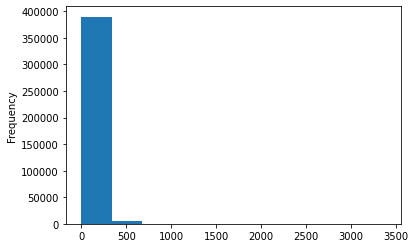

In [49]:
df['Text_processed'].str.split().str.len().plot.hist()

In [63]:
df.shape[0]

395003

In [102]:
cnt = 0
for index,text in enumerate(df['Text_processed'].str.split().str.len()):
    if text > 485:
        cnt = cnt +1
print("{:.2%} in the training set are longer than 485 tokens".format(cnt/df['Text_processed'].count()))

0.39% in the training set are longer than 485 tokens


### Drop Rows with `Text` > 485 tokens

In [103]:

for index,text in enumerate(df['Text_processed'].str.split().str.len()):
    if text > 485:
        df.drop(index, inplace=True)
        print(index)
        




527
538
1049
1317
1494
1822
2485
2603
2891
2921
2935
3013
3014
3016
3297
4296
4305
4397
4572
5351
5427
5691
5979
6215
6829
7586
7788
7882
8052
8730
9368
9399
9523
10424
11243
11379
11668
11681
11744
12498
12528
12633
12713
13438
13472
13524
13554
14190
14340
14819
15471
16157
16244
16269
16423
16492
16557
17435
17599
17750
17897
17925
18039
18928
18931
18970
19006
19184
19205
19658
19714
19716
19733
19734
19756
19777
19790
19796
19829
20908
20996
21581
21760
21765
21768
22200
22317
22369
22658
23722
23785
23790
23800
23905
24035
24314
24455
24688
24694
25775
26395
26438
27096
27882
28272
29842
30128
30364
30572
30651
32252
32489
33015
33462
33522
33587
33787
34068
34096
34308
34359
34638
34731
35156
35283
35359
36348
36462
36664
37044
37542
37545
37606
37691
37735
38366
38685
38861
39122
39204
39219
39284
39392
39480
39604
39609
39865
39885
40063
40118
40146
40156
40248
41000
41366
41367
41552
41634
41646
42508
42774
42798
43250
43289
43703
44445
44643
44712
46035
46244
46720
46844
468

In [104]:
df.shape

(393481, 5)

### Token adaption for Bert
##### clearly most commetns are below threshold of 512 Token. There is a tail with larger token numbers  How many of the examples run into the 512-token limit? 

## Save BERT Preprocessed DataFrame 

In [108]:
df.to_csv("../../data/processed/BertConformPreprocessedReviews.csv", index=False)

# REMINDER - There are `Summary_processed` with empty().
###### Can be processed in an aditional step, (only 36 entries)


In [112]:
#example
df.iloc[13277].to_frame()

,13320
Score,5
Summary,=]
Text,"I still have some of this; I didn't expect it to have much of a flavor, being so small, but it definitely is nutty. I have this as a snack for my daily fiber! :)"
Summary_processed,
Text_processed,"I still have some of this I didn't expect it to have much of a flavor, being so small, but it definitely is nutty. I have this as a snack for my daily fiber ! Happy_face_or_smiley"
